data/TBD6_BM/outs/per_sample_outs/TBD6_BM/count/sample_feature_bc_matrix/
data/TBD6_PBMC/outs/per_sample_outs/TBD6_PBMC/count/sample_feature_bc_matrix/
data/TBD6_LN/outs/per_sample_outs/TBD6_LN/count/sample_feature_bc_matrix/
data/TBD6_SPL/outs/per_sample_outs/TBD6_SPL/count/sample_feature_bc_matrix/
data/TBD6_BM_Overload/outs/per_sample_outs/TBD6_BM_Overload/count/sample_feature_bc_matrix/
data/TBD6_PBMC_Overload/outs/per_sample_outs/TBD6_PBMC_Overload/count/sample_feature_bc_matrix/
data/TBD6_LN_Overload/outs/per_sample_outs/TBD6_LN_Overload/count/sample_feature_bc_matrix/
data/TBD6_SPL_Overload/outs/per_sample_outs/TBD6_SPL_Overload/count/sample_feature_bc_matrix/


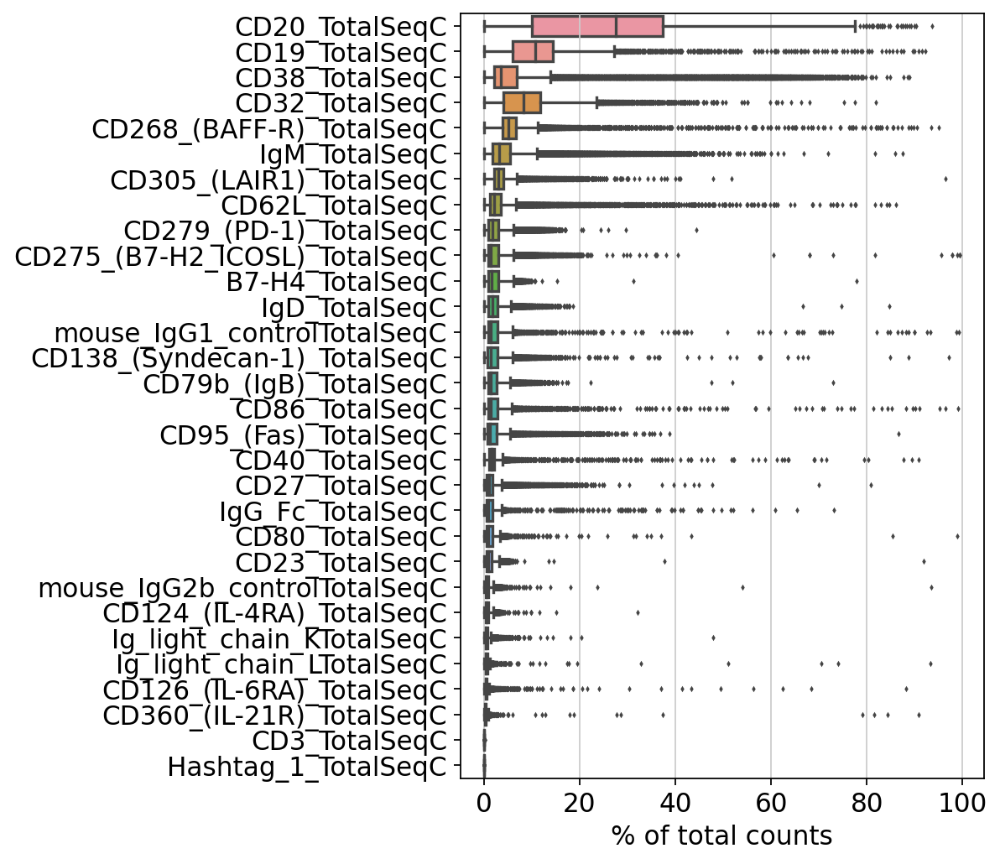

/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'tissue' as categorical
/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'feature_types' as categorical


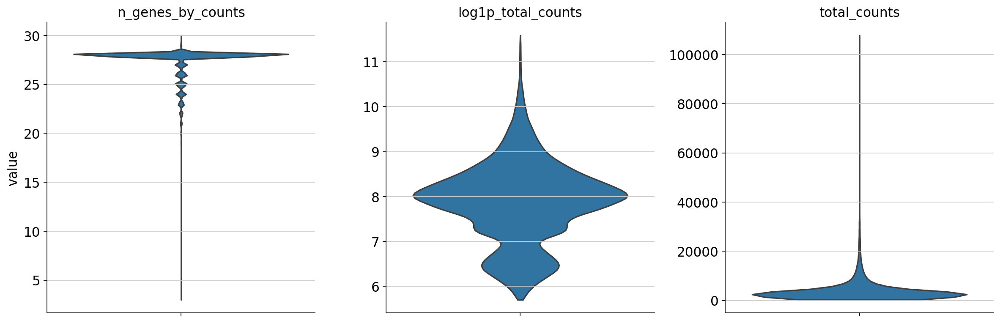

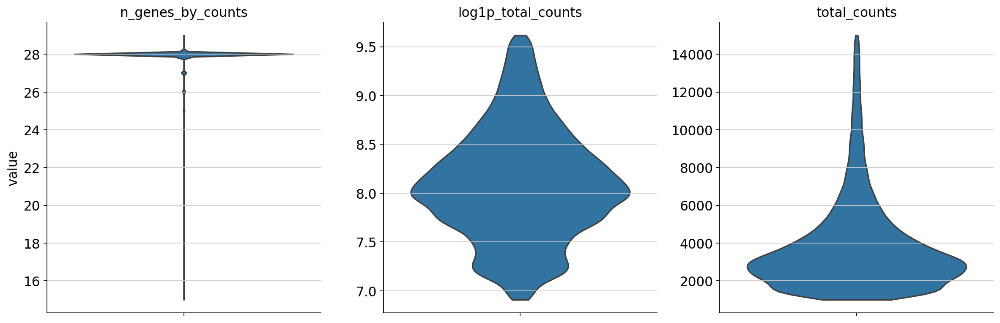

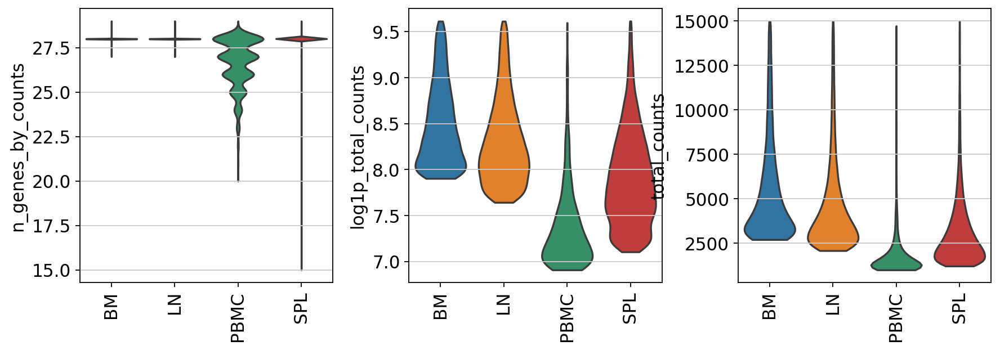

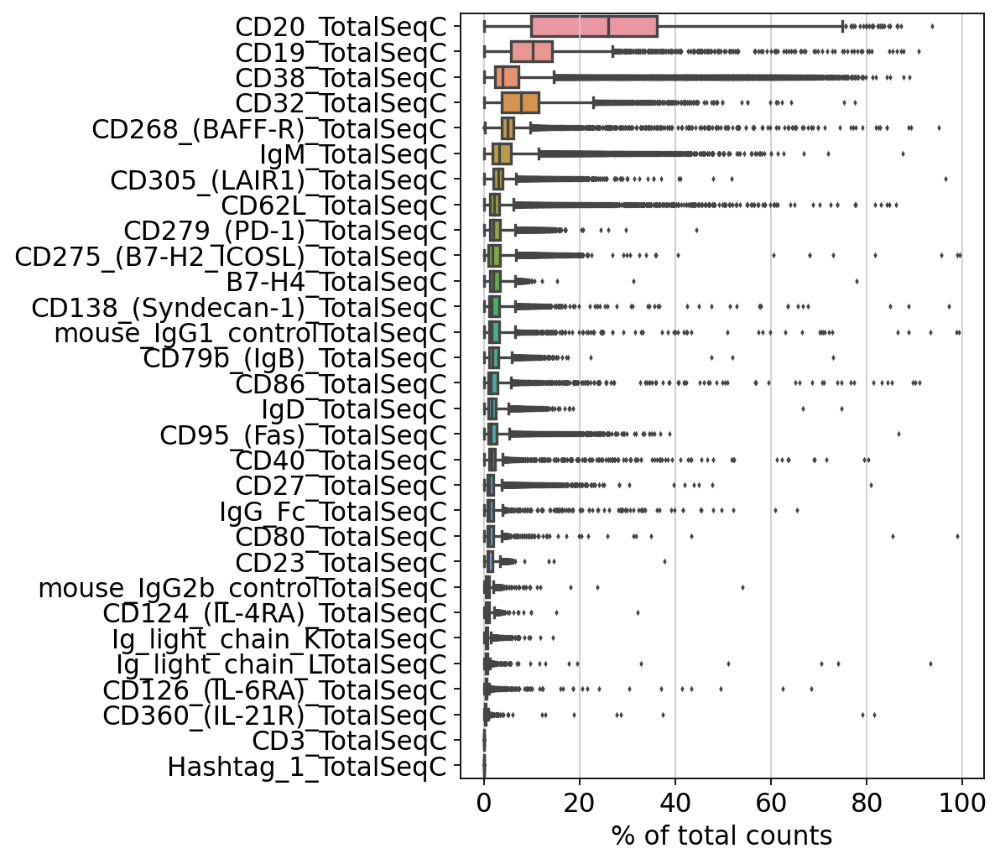

/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/muon/_prot/preproc.py:214: UserWarning: adata.X is sparse but not in CSC format. Converting to CSC.
  warn("adata.X is sparse but not in CSC format. Converting to CSC.")


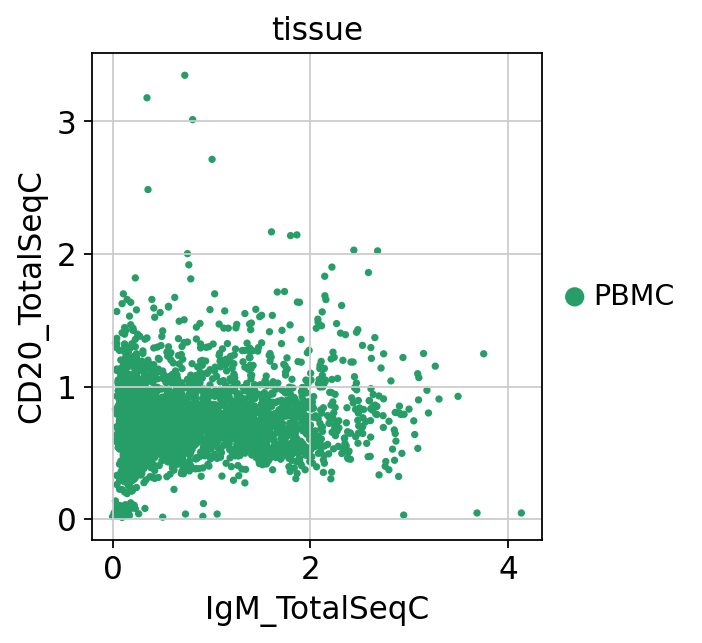

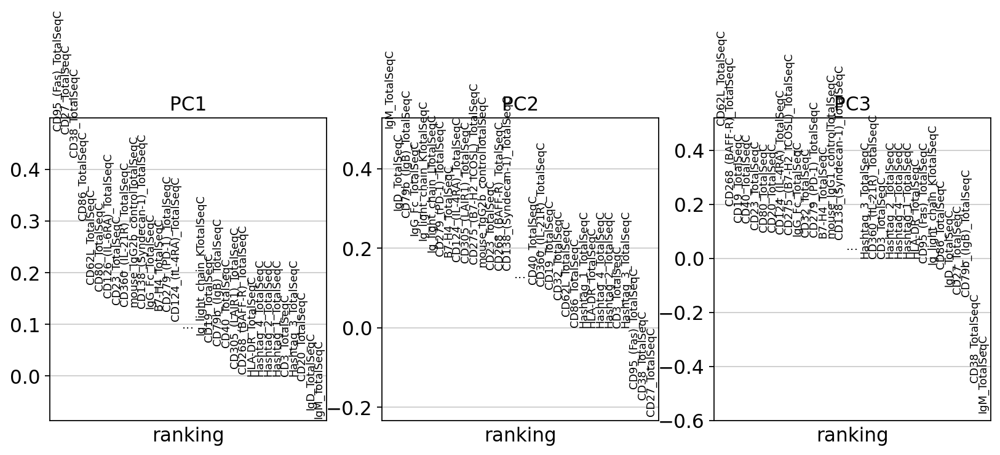

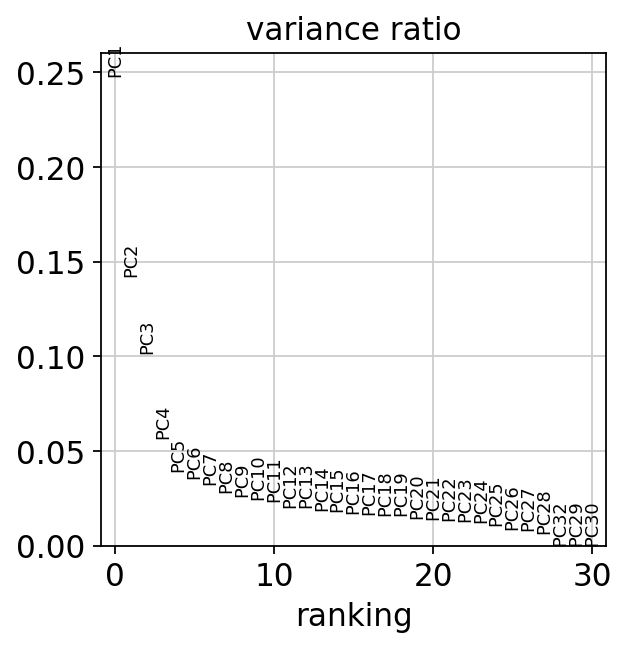

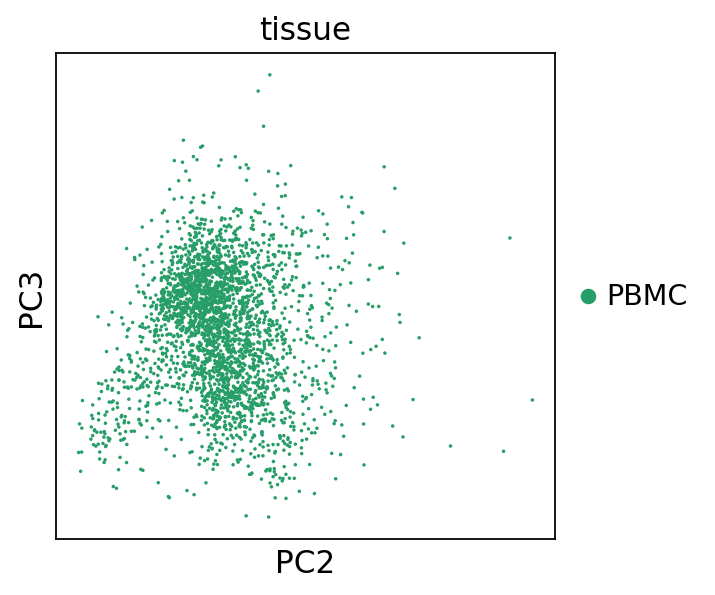

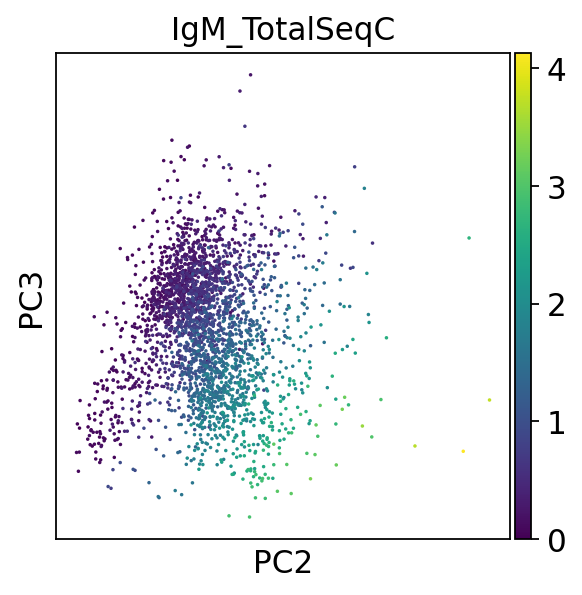

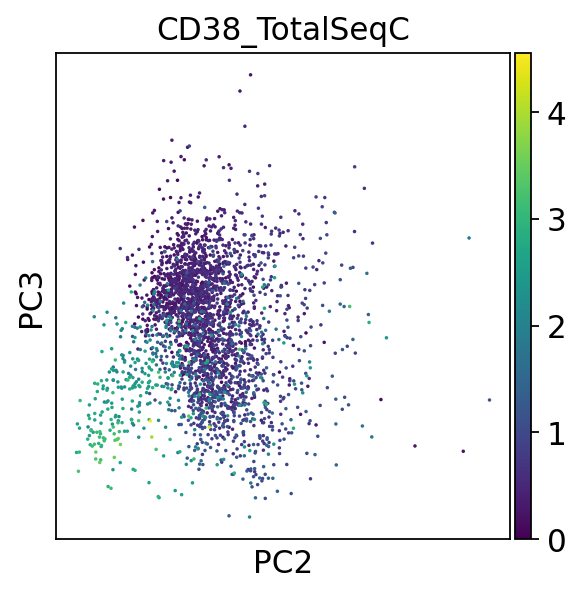

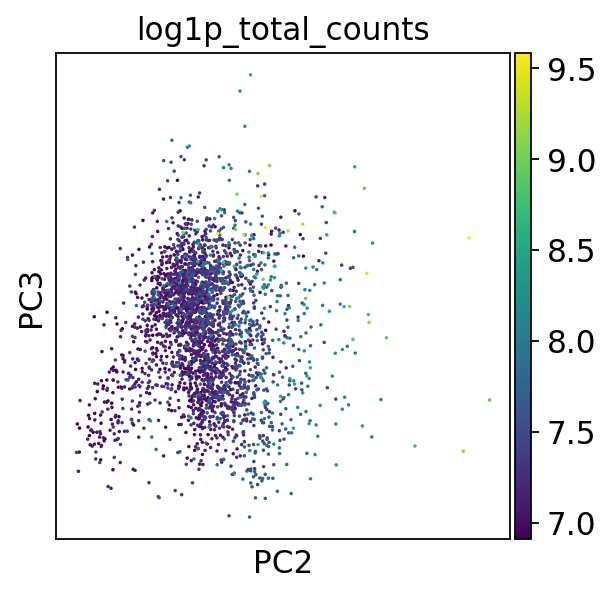

/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/seaborn/axisgrid.py:1670: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
/home/michaelswift/miniconda3/envs/muon/lib/python3.9/site-packages/seaborn/distributions.py:316: 

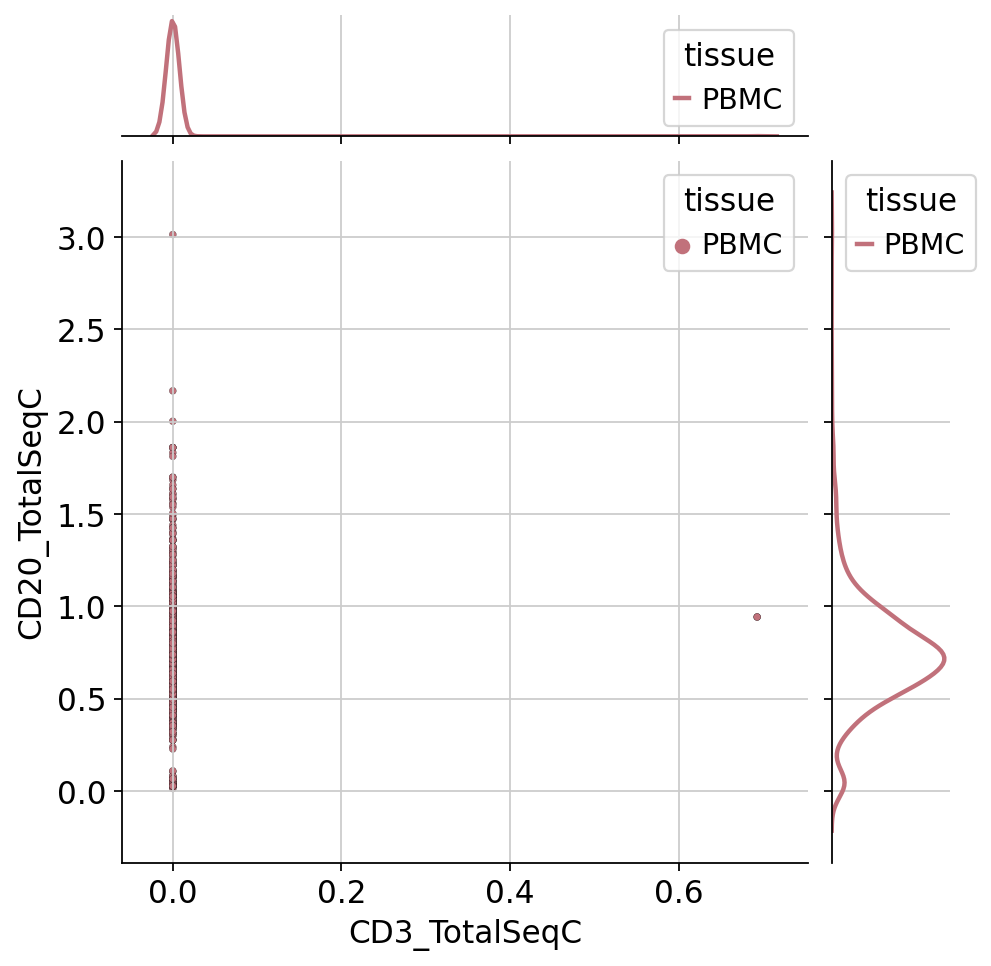

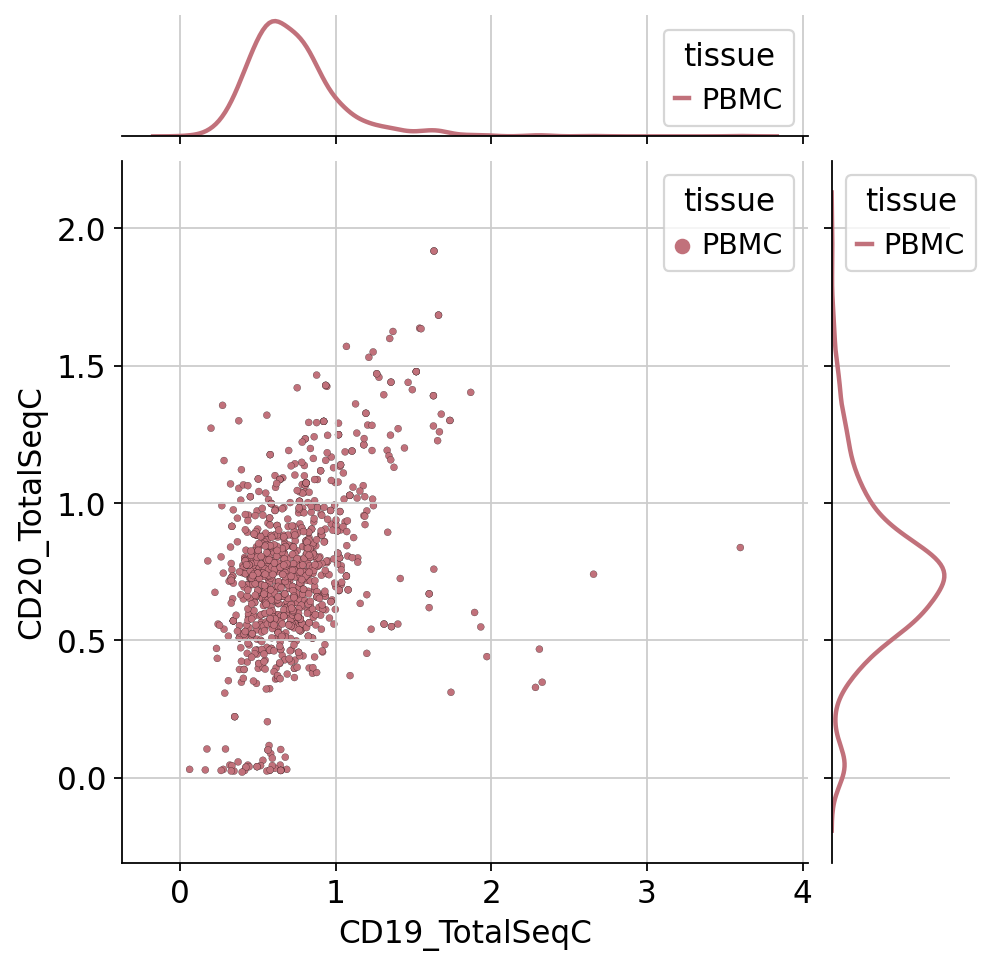

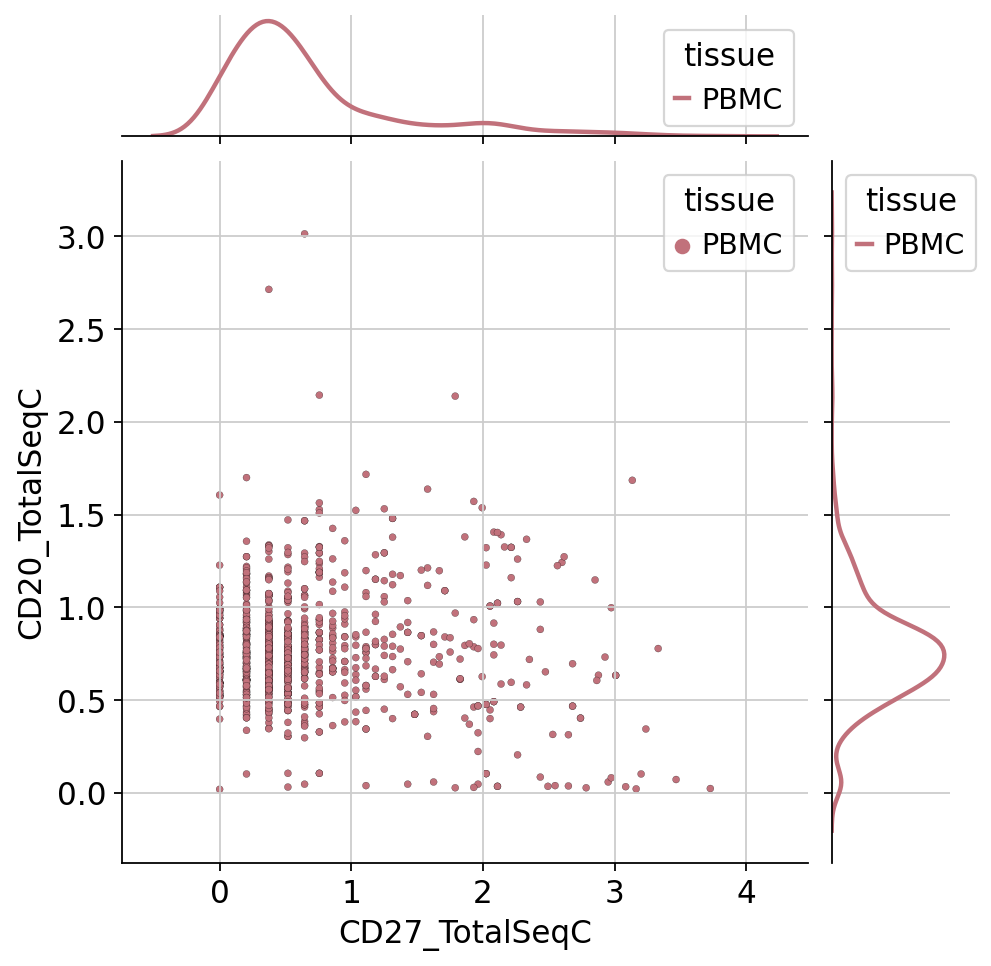

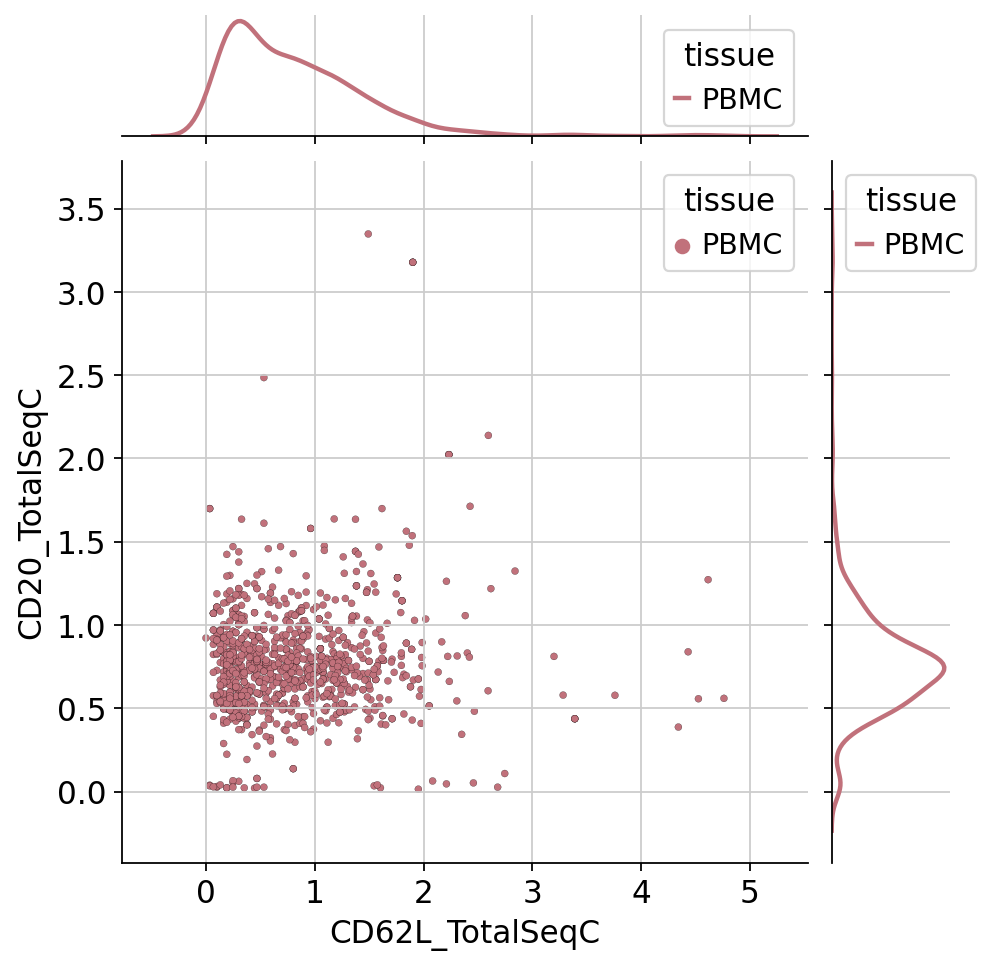

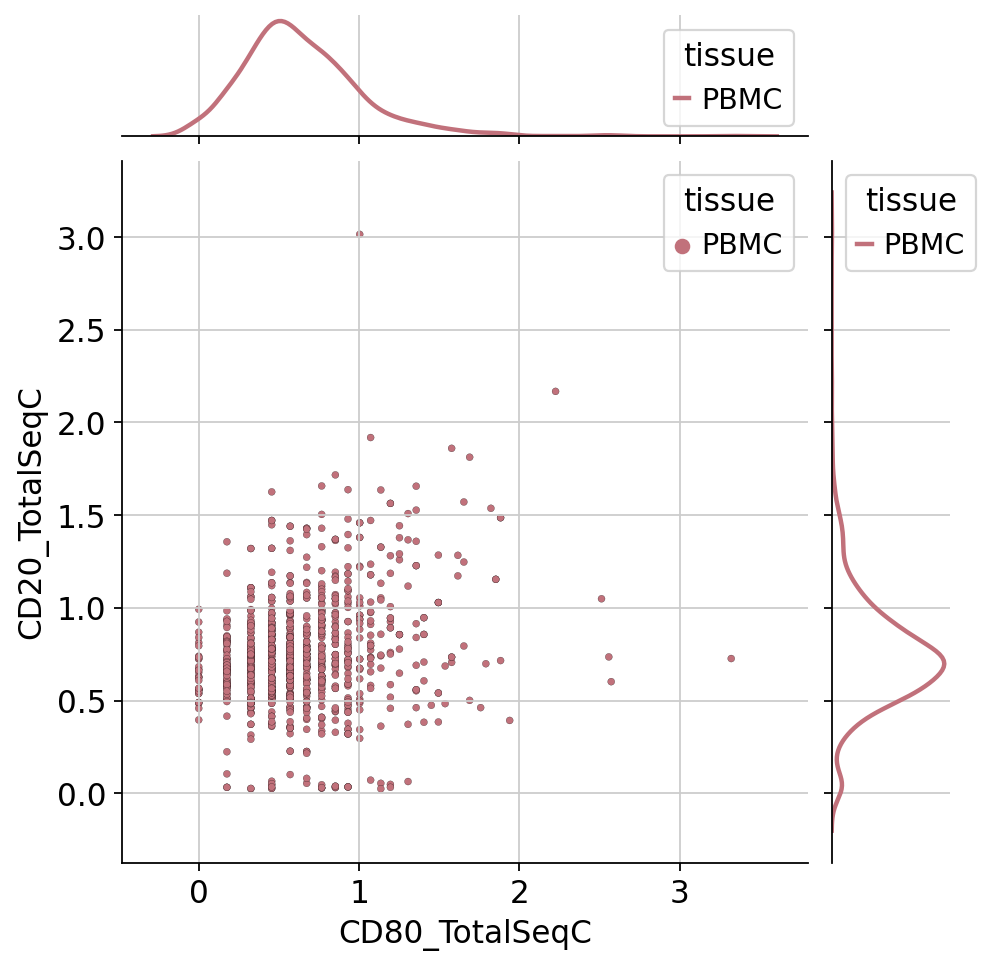

...

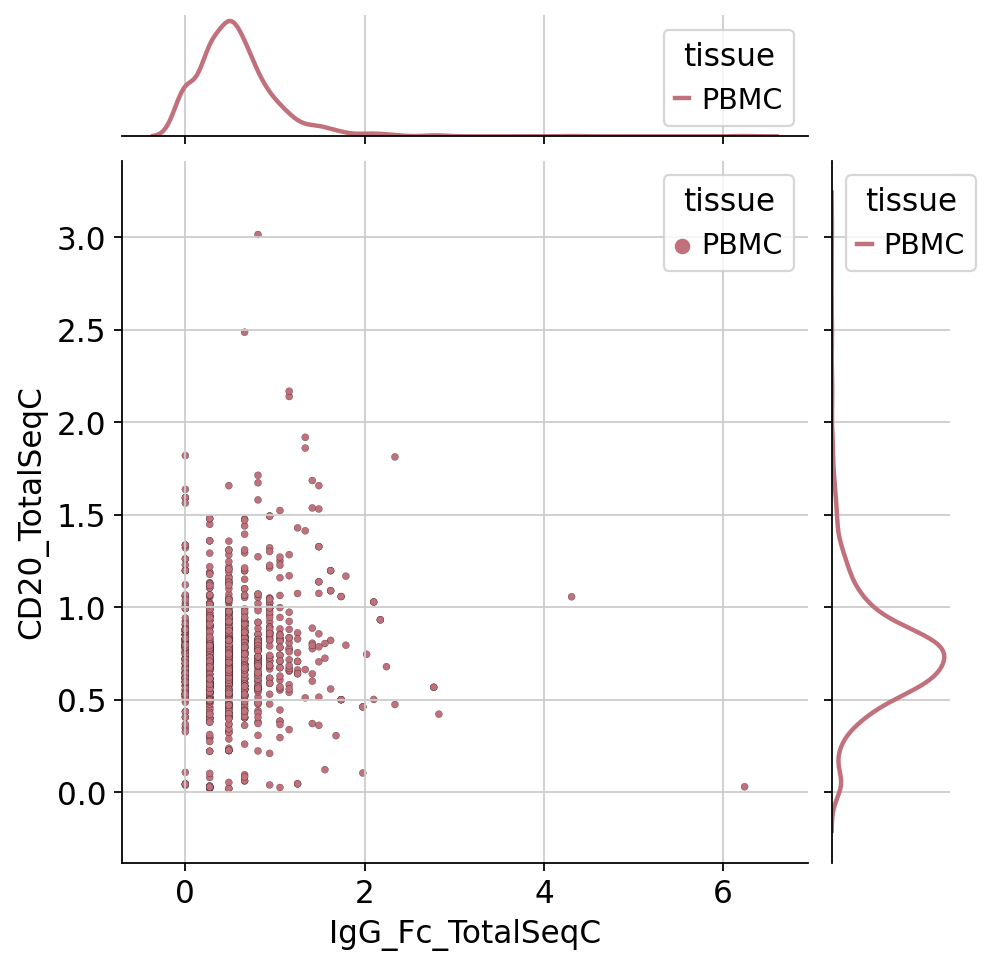

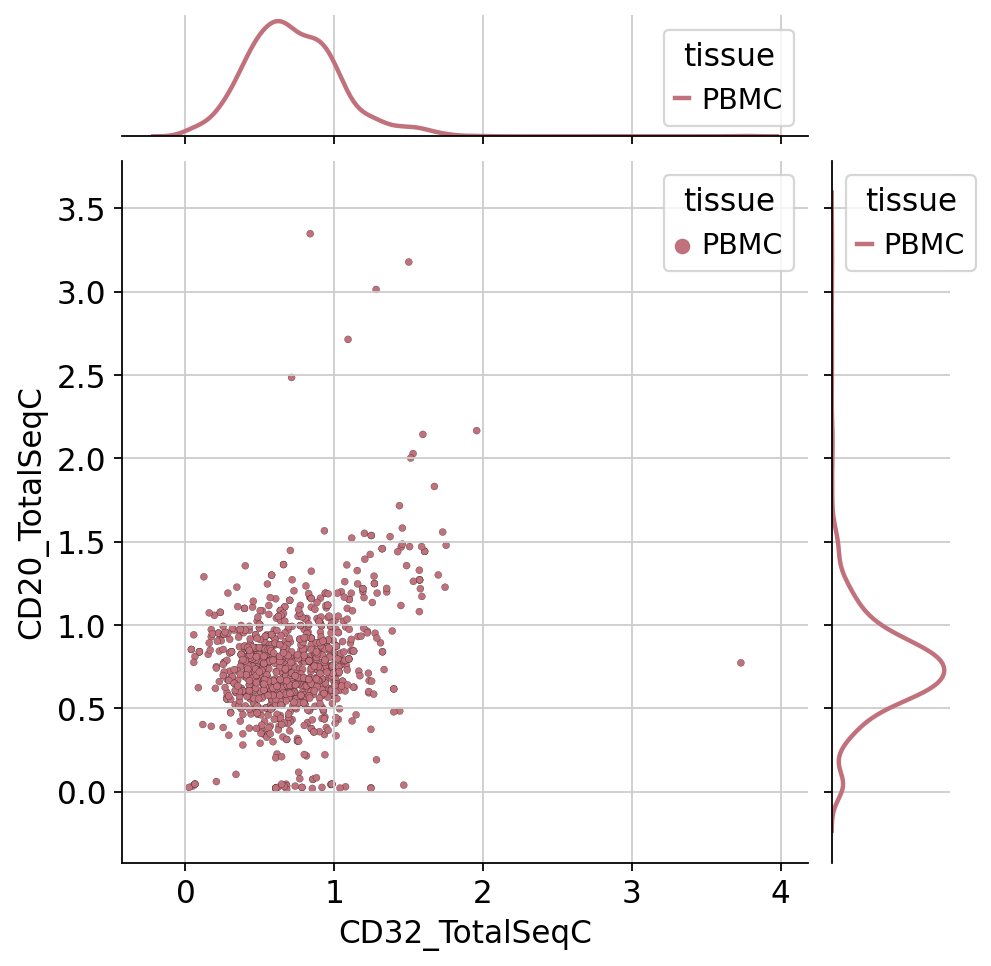

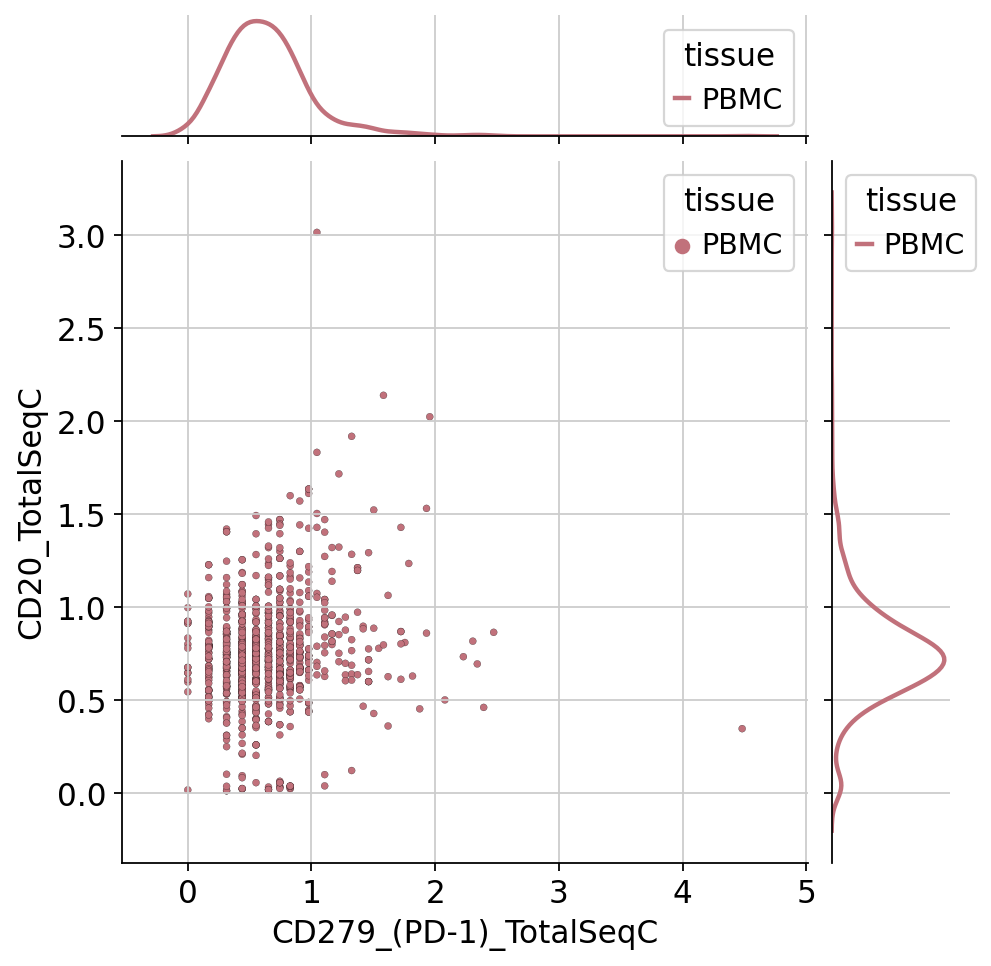

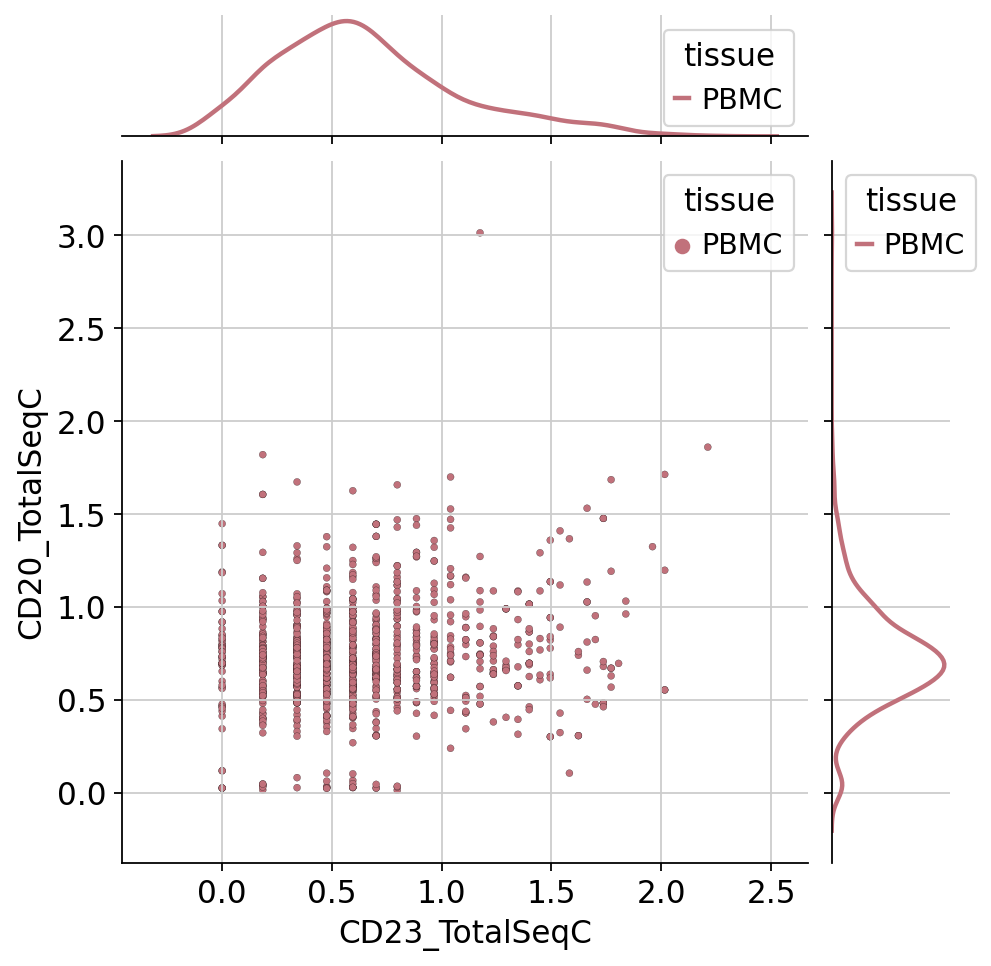

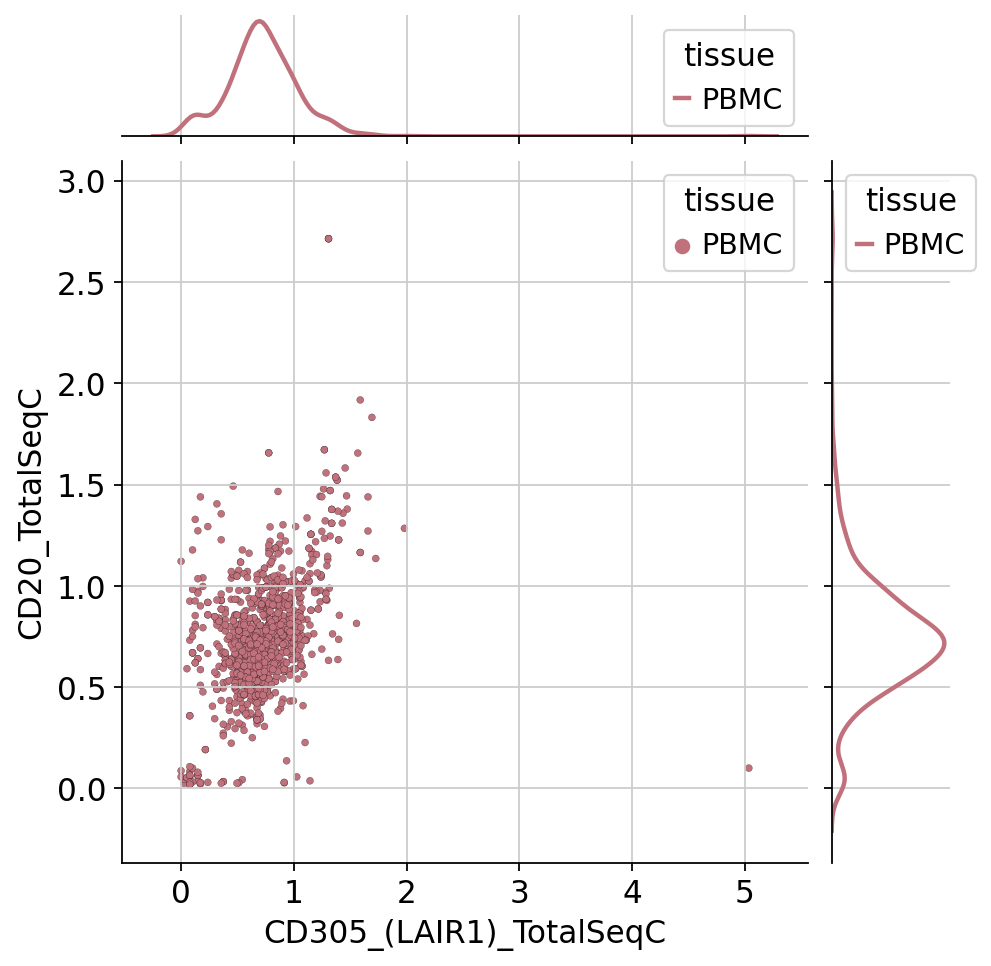

In [1]:
import pandas as pd
import scanpy as sc
import scirpy as ir
import numpy as np
import pathlib
import muon as mu
from muon import prot as pt
import os
import numpy as np
savefig_args = {"dpi": 300, "bbox_inches": "tight", "pad_inches": 0, "transparent": True}
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
overload = True
if overload == True:
    output_dir='figures/overload'
else:
    output_dir = "figures/no_overload"

pathlib.Path(output_dir).mkdir(parents=True, exist_ok=True)
output_suffix = ""
output_formats = [".png", ".svg"]
sc.settings.figdir = output_dir
sc.set_figure_params(dpi_save = 300)
sc.set_figure_params(format = 'png')
def save_figure(fig, name, output_dir=output_dir, output_suffix=output_suffix, output_formats=output_formats, savefig_args=savefig_args):
    for output_format in output_formats:
        fig.savefig(output_dir + "/" + name + output_suffix + output_format, **savefig_args)
    return None


donor = 'TBD6'
data = 'data'
samples = ['BM', 'PBMC', 'LN', 'SPL', 'BM_Overload', 'PBMC_Overload', 'LN_Overload', 'SPL_Overload']
prots = []
tenX_output = 'filtered'

def load_data(samplenames, data, donor, overload):
    """samplename is a list of samplenames, 
    data is where the data were downloaded
    donor is the name of the donor
    all of these info are used to create the file path
    """
    
    for sample in samples:
        if tenX_output == 'raw':
            datapath = '{}/{}_{}/outs/multi/count/raw_feature_bc_matrix/'.format(data, donor, sample)
            print(datapath)
            prot = mu.read_10x_mtx(datapath)
            prots.append(prot)
            prot['prot'].obs['tissue'] = sample
        if tenX_output == 'filtered':
            datapath = '{}/{}_{}/outs/per_sample_outs/{}_{}/count/sample_feature_bc_matrix/'.format(data, donor, sample, donor ,sample)
            print(datapath)
            prot = mu.read_10x_mtx(datapath)
            prots.append(prot)
            prot['prot'].obs['tissue'] = sample
 
    adatas = []
    for prot in prots:
        adata = prot['prot']
        adatas.append(adata)
    if overload == True:
        analysis = "with_overload"
    else:
        analysis = "without_overload"
    if overload:
    # hard coded number of samples right now
        adata = adatas[0].concatenate(adatas[1], adatas[2], adatas[3], adatas[4], adatas[5], adatas[6], adatas[7])
    else:
        adata = adatas[0].concatenate(adatas[1], adatas[2], adatas[3])
    return adata
    
def perform_qc(adata):    
    # calculate qc metrics
    sc.pp.calculate_qc_metrics(adata, percent_top=False, inplace = True)
    sc.pl.highest_expr_genes(adata,save='prefilter')
    # plot qc metrics
    sc.pl.violin(adata, ['n_genes_by_counts', 'log1p_total_counts', 'total_counts'], stripplot=False, multi_panel=True, save='prefilter')
    # cell filter
    sc.pp.filter_cells(adata, min_counts=1000)
    sc.pp.filter_cells(adata, max_counts=15000)

    # plot results of filtering
    sc.pl.violin(adata, ['n_genes_by_counts', 'log1p_total_counts', 'total_counts'], stripplot=False, multi_panel=True, save='postfilter')
    sc.pl.violin(adata, ['n_genes_by_counts', 'log1p_total_counts', 'total_counts'], stripplot=False, multi_panel=True, rotation = 90, groupby='tissue', save='postfilter_tissue')

    sc.pl.highest_expr_genes(adata, save='postfilter')
    df = sc.get.obs_df(adata, keys=['mouse_IgG1_controlTotalSeqC', 'mouse_IgG2b_controlTotalSeqC'])
    good_cells = df[df['mouse_IgG1_controlTotalSeqC'] < 30]
    adata = adata[adata.obs.index.isin(good_cells.index)]
    adata = adata[adata.obs.tissue.str.contains('PB')]
    return adata

# create mdata object
adata = load_data(samplenames=samples, data = data, donor=donor, overload=False)

adata = perform_qc(adata)

mdata = mu.MuData({'prot': adata})
prot = mdata['prot']
prot.layers['counts'] = prot.X

# a type of normalization reported to be good for cite-seq
pt.pp.clr(mdata['prot'])
sc.pl.scatter(prot, x="IgM_TotalSeqC", y="CD20_TotalSeqC", color='tissue')
sc.tl.pca(prot)
sc.pl.pca_overview(prot, color = 'tissue', save='pca_')

sc.pl.pca_scatter(prot, color = 'tissue', components=[2,3], size=10, save='tissue')

sc.pl.pca_scatter(prot, color = 'IgM_TotalSeqC', components=[2,3], size=10, save = 'Igm')

sc.pl.pca_scatter(prot, color = 'CD38_TotalSeqC', components=[2,3], size=10, save = 'CD38')

sc.pl.pca_scatter(prot, color = 'log1p_total_counts', components=[2,3], size=10, save = 'log1p_total_counts')
sc.pp.neighbors(prot)


def kdeplot(prot, pair, ok):
        data = sc.get.obs_df(prot, keys = [pair[0], pair[1], ok])
        data = data.groupby(ok).sample(n = 1000, replace = True)
        # allows resampling the same cell
        data.reset_index(inplace = True)
        g = sns.JointGrid()
        x, y, hue = data[pair[0]], data[pair[1]], data[ok]
        sns.scatterplot(x=x, y=y, hue = hue, palette=palette, s=10, linewidth=0.1, edgecolor = 'k', ax=g.ax_joint)
        sns.kdeplot(x=x, hue=hue, palette=palette, fill=False, linewidth=2, ax=g.ax_marg_x)
        sns.kdeplot(y=y, hue=hue, palette=palette, linewidth=2, fill=False, ax=g.ax_marg_y)
        return g

import itertools
ok = 'tissue'
single_pair = ("CD20_TotalSeqC", True)
palette = {'SPL':'#765760', 'PBMC':'#C1717B', 'BM':'#266967', 'LN':'#E4B363'}
for pair in list(itertools.permutations(prot.var.index, 2)):
    if pair[1] == 'CD20_TotalSeqC':
        g = kdeplot(prot, pair, ok)
        save_figure(g.fig, "{}_{}")   


In [2]:
prot.obs.tissue.value_counts()

PBMC    2755
Name: tissue, dtype: int64

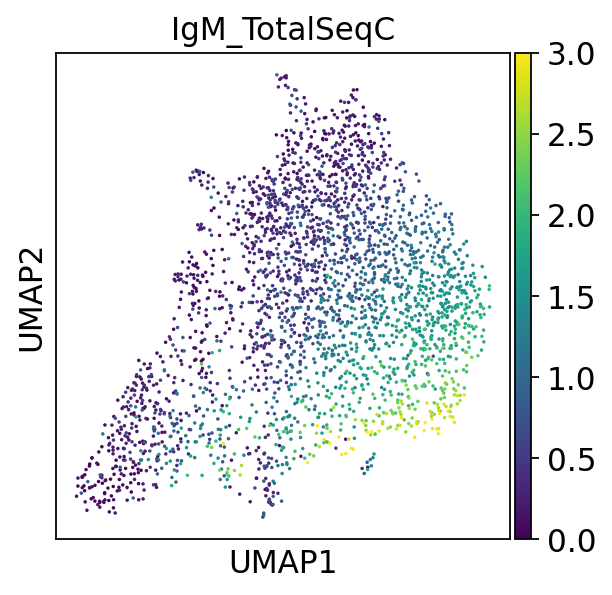

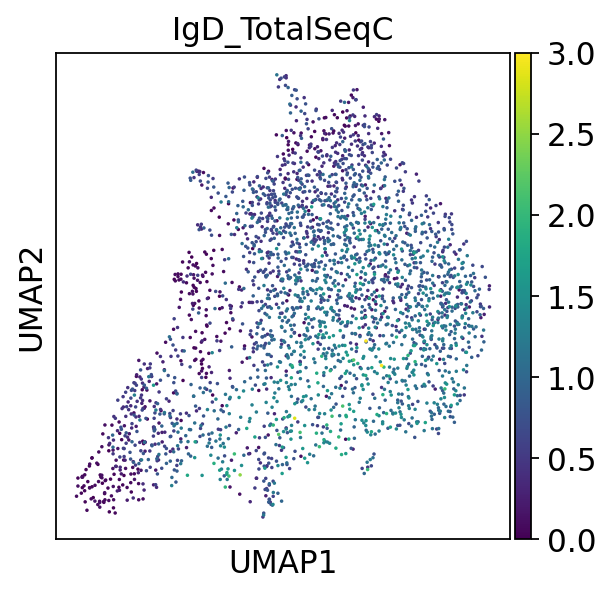

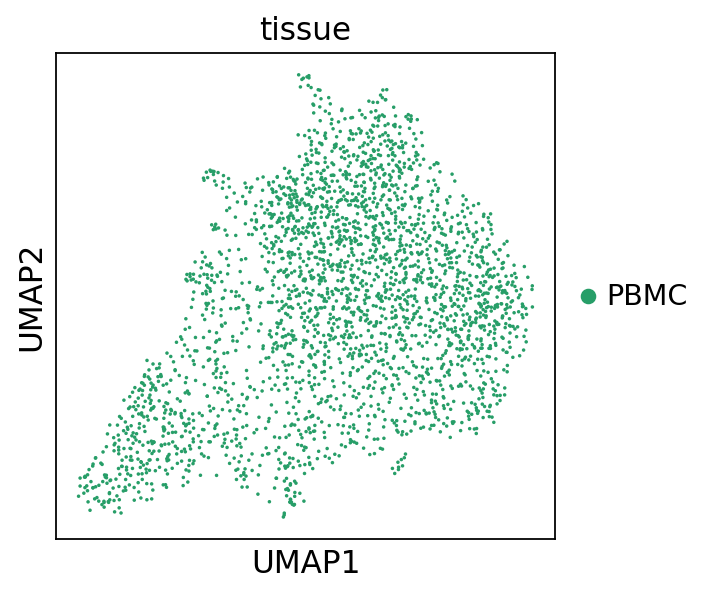

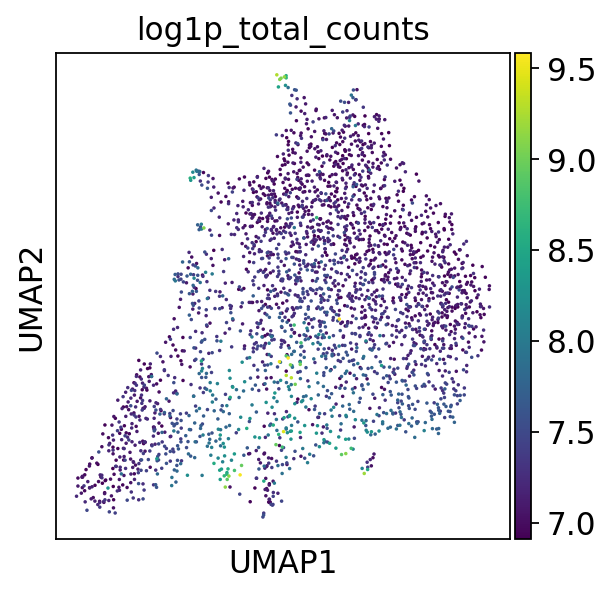

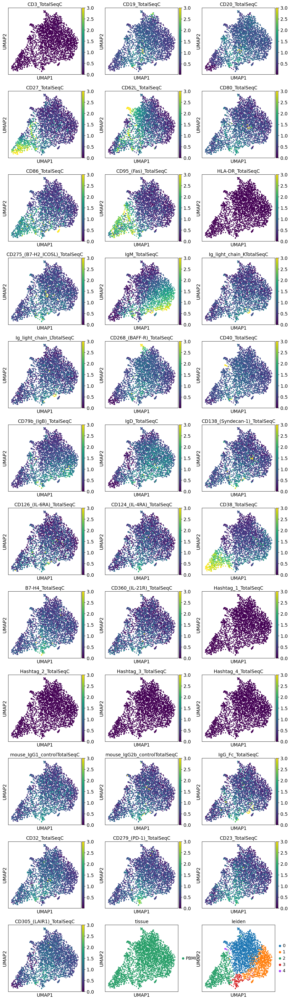

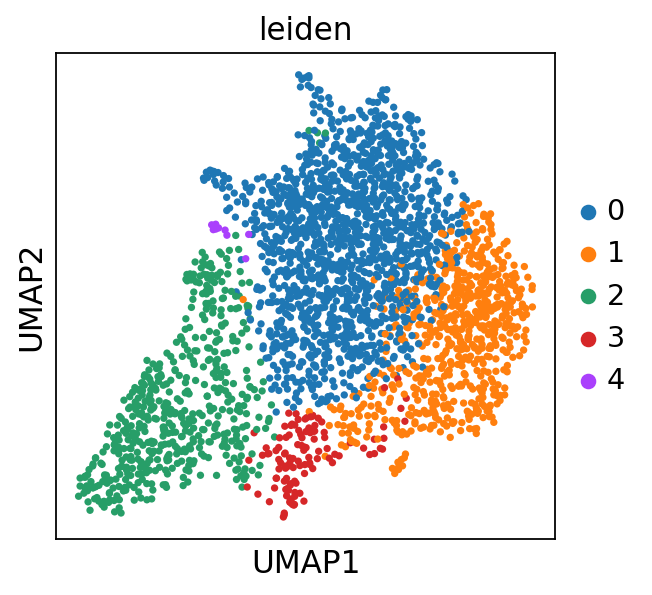

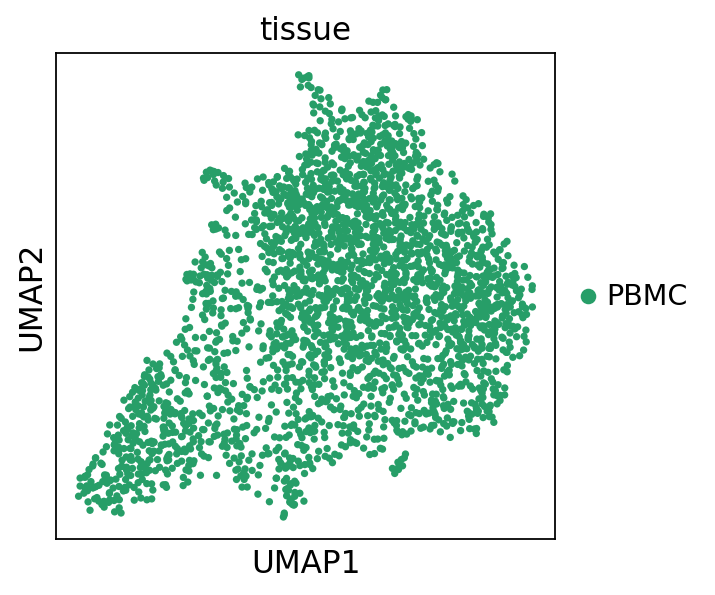

In [3]:

sc.tl.umap(prot, random_state=1)

sc.pl.umap(prot, color="IgM_TotalSeqC", ncols=1, vmax=3, size=10)

sc.pl.umap(prot, color="IgD_TotalSeqC", ncols=1, vmax=3, size=10)

sc.pl.umap(prot, color="tissue", ncols=1, vmax=3, size=10,save ='tissue')
color = "log1p_total_counts"
sc.pl.umap(prot, color="log1p_total_counts", ncols=1, size=10, save = color)
sc.tl.leiden(adata, resolution=0.3)
sc.pl.umap(prot, color=list(prot.var.index.values) + ['tissue', 'leiden'], ncols=3, vmax = 3, save = 'all')

sc.pl.umap(adata, color = 'leiden', save='leiden')
sc.pl.umap(adata, color = 'tissue', save='tissue')

In [4]:
sc.tl.rank_genes_groups(adata,groupby='leiden', use_raw=False,)

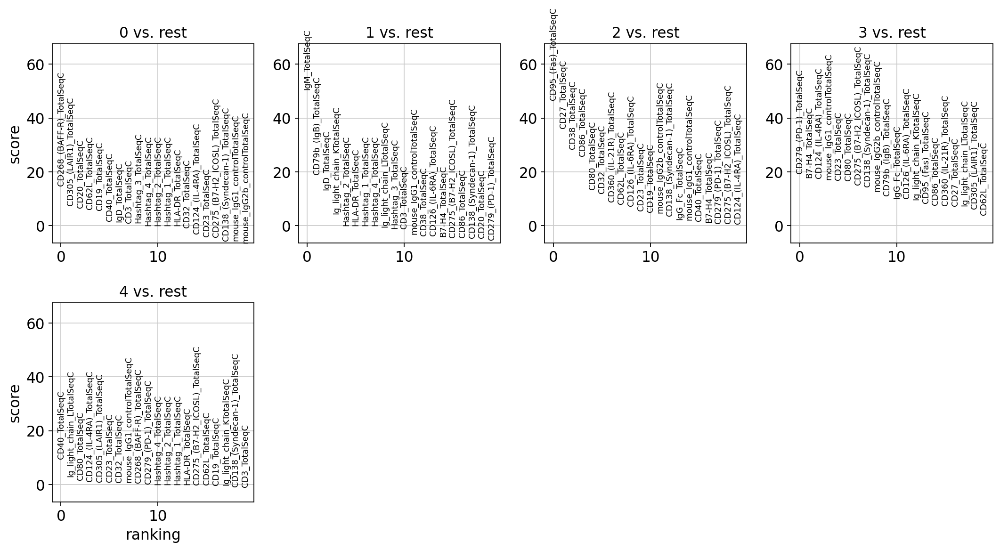

In [5]:
sc.pl.rank_genes_groups(adata, save='rank_genes')

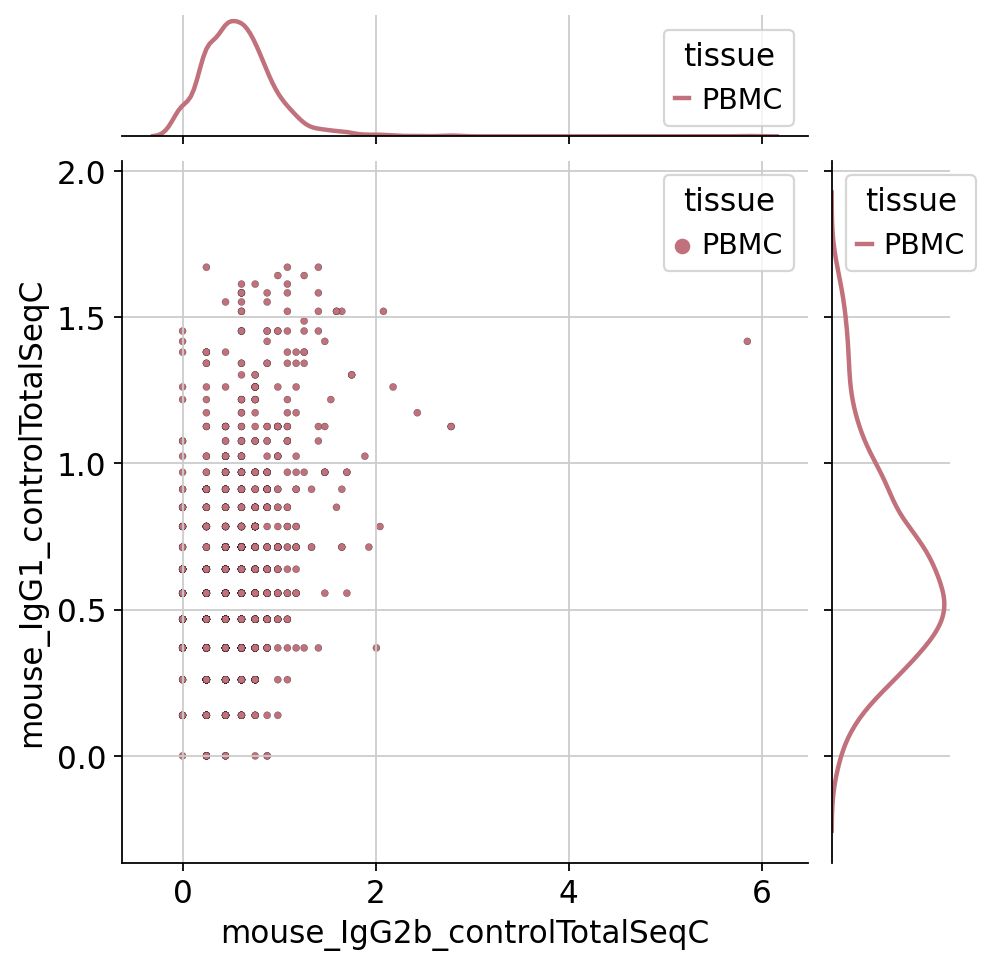

In [6]:
kdeplot(prot, ('mouse_IgG2b_controlTotalSeqC', 'mouse_IgG1_controlTotalSeqC'),'tissue')

In [7]:
sns.displot(data = df, x = 'mouse_IgG1_controlTotalSeqC', kind = 'ecdf', log_scale=True)

NameError: name 'df' is not defined